In [1]:
import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data import DataLoader

import lib.dist as dist
import lib.utils as utils

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams.update({
    'font.family' : 'STIXGeneral',
    'mathtext.fontset' : 'stix', 
    'xtick.labelsize' : 13,
    'xtick.top' : True,
    'xtick.direction' : 'in',
    'ytick.direction' : 'in',
    'ytick.labelsize' : 13, 
    'ytick.right' : True, 
    'axes.labelsize' : 16,
    'legend.frameon': False,
    'legend.fontsize': 13,
    'legend.handlelength' : 1.5,
    'savefig.dpi' : 600,
    'savefig.bbox' : 'tight'
})
torch.__version__

'1.7.1'

In [15]:
spin2d = np.arange(900*32*32)
spin2d = spin2d.reshape(900, 32*32)
s_len = 32*32
for n in range (30):
    txt = np.loadtxt(f'isingspin/spin32_{n:02d}.txt')
    spin2d[30*n:30*(n+1)] = txt[:30, 2:].reshape(30, 32*32)

latent_dim = 16
beta = 8
prior_dist = dist.Normal()
q_dist = dist.Normal()

spin2d = torch.Tensor(spin2d)

In [39]:
class NEncoder(nn.Module):
    def __init__(self, output_dim):
        super(NEncoder, self).__init__()
        self.output_dim = output_dim

        self.L1 = nn.Linear(s_len, 128)
        self.b1 = nn.Linear(128, 1, bias=False)
        self.L2 = nn.Linear(128, output_dim)
        self.b2 = nn.Linear(output_dim, 1, bias=False)

        # setup the non-linearity
        self.act = nn.Tanh()
        self.sig = nn.Sigmoid()
        
        nn.init.xavier_normal_(self.L1.weight)
        nn.init.xavier_normal_(self.L2.weight)
        self.b1.weight.data.fill_(0)
        self.b2.weight.data.fill_(0)

    def forward(self, x):
        h = x.view(-1, s_len)
        h = self.act(self.L1(h)+self.b1.weight)
        h = self.L2(h)+self.b2.weight
        z = self.sig(h).view(x.size(0), self.output_dim)
        return z
    
class NDecoder(nn.Module):
    def __init__(self, input_dim):
        super(NDecoder, self).__init__()
        self.L1 = nn.Linear(128, s_len)
        self.b1 = nn.Linear(s_len, 1, bias=False)
        self.L2 = nn.Linear(input_dim, 128)
        self.b2 = nn.Linear(128, 1, bias=False)

        # setup the non-linearity
        self.act = nn.Tanh()
        self.sig = nn.Sigmoid()
        
        nn.init.xavier_normal_(self.L1.weight)
        nn.init.xavier_normal_(self.L2.weight)
        self.b1.weight.data.fill_(0)
        self.b2.weight.data.fill_(0)

    def forward(self, z):
        h = z.view(z.size(0), z.size(1))
        h = self.act(self.L2(h)+self.b2.weight)
        mu_img = self.act(self.L1(h)+self.b1.weight)
        return mu_img
    
def logsumexp(value, dim=None, keepdim=False):
    """Numerically stable implementation of the operation
    value.exp().sum(dim, keepdim).log()
    """
    if dim is not None:
        m, _ = torch.max(value, dim=dim, keepdim=True)
        value0 = value - m
        if keepdim is False:
            m = m.squeeze(dim)
        return m + torch.log(torch.sum(torch.exp(value0),
                                       dim=dim, keepdim=keepdim))
    else:
        m = torch.max(value)
        sum_exp = torch.sum(torch.exp(value - m))
        if isinstance(sum_exp, Number):
            return m + math.log(sum_exp)
        else:
            return m + torch.log(sum_exp)
        
def display_samples(model, x):
    fig, ax = plt.subplots(2,1, figsize = (13, 2))
    th = 1
    sample_mu = model.model_sample(batch_size=50).sigmoid()
    xs, x_params, zs, z_params = model.reconstruct_img(x)
    ax[0].imshow(x, aspect='auto')
    ax[1].imshow(xs, aspect='auto')
    #ax[2].imshow(x_params[th,0].detach().numpy())
    #ax[3].imshow(z_params[:,:,0].detach().numpy())
    #ax[4].imshow(z_params[:,:,1].detach().numpy())
    plt.show()

In [40]:
### beta-TCVAE
class TCVAE(nn.Module):
    def __init__(self, z_dim, beta, prior_dist=dist.Normal(), q_dist=dist.Normal(),
                 include_mutinfo=True, tcvae=True, mss=True):
        super(TCVAE, self).__init__()
        
        self.z_dim = z_dim
        self.include_mutinfo = include_mutinfo
        self.tcvae = tcvae
        self.lamb = 0
        self.beta = beta
        self.mss = mss
        self.x_dist = dist.Bernoulli()

        self.prior_dist = prior_dist
        self.q_dist = q_dist
        self.register_buffer('prior_params', torch.zeros(self.z_dim, 2))

        self.encoder = NEncoder(z_dim * self.q_dist.nparams)
        self.decoder = NDecoder(z_dim)

    def _get_prior_params(self, batch_size=1):
        expanded_size = (batch_size,) + self.prior_params.size()
        prior_params = Variable(self.prior_params.expand(expanded_size))
        return prior_params
    
    def model_sample(self, batch_size=1):
        prior_params = self._get_prior_params(batch_size)
        zs = self.prior_dist.sample(params=prior_params)
        x_params = self.decoder.forward(zs)
        return x_params

    def encode(self, x):
        x = x.view(x.size(0), 32*32)
        z_params = self.encoder.forward(x).view(x.size(0), self.z_dim, self.q_dist.nparams)
        zs = self.q_dist.sample(params=z_params)
        return zs, z_params

    def decode(self, z):
        x_params = self.decoder.forward(z).view(z.size(0), 32*32)
        xs = self.x_dist.sample(params=x_params)
        return xs, x_params

    def reconstruct_img(self, x):
        zs, z_params = self.encode(x)
        xs, x_params = self.decode(zs)
        return xs, x_params, zs, z_params
    
    def _log_importance_weight_matrix(self, batch_size, dataset_size):
        N = dataset_size
        M = batch_size - 1
        strat_weight = (N - M) / (N * M)
        W = torch.Tensor(batch_size, batch_size).fill_(1 / M)
        W.view(-1)[::M+1] = 1 / N
        W.view(-1)[1::M+1] = strat_weight
        W[M-1, 0] = strat_weight
        return W.log()
    
    def elbo(self, x, dataset_size):
        batch_size = x.size(0) 
        x = x.view(batch_size, 32*32)
        prior_params = self._get_prior_params(batch_size)
        x_recon, x_params, zs, z_params = self.reconstruct_img(x)
        logpx = self.x_dist.log_density(x, params=x_params).view(batch_size, -1).sum(1)
        logpz = self.prior_dist.log_density(zs, params=prior_params).view(batch_size, -1).sum(1)
        logqz_condx = self.q_dist.log_density(zs, params=z_params).view(batch_size, -1).sum(1) 

        elbo = logpx + logpz - logqz_condx # log p(x|z) + log p(z) - log q(z|x)
        # log q(z) ~ log 1/(NM) sum_m=1^M q(z|x_m) = - log(MN) + logsumexp_m(q(z|x_m))
        _logqz = self.q_dist.log_density(zs.view(batch_size, 1, self.z_dim),
                                         z_params.view(1, batch_size, self.z_dim, self.q_dist.nparams))

        if not self.mss: # minibatch weighted sampling
            logqz_prodmarginals = (logsumexp(_logqz, dim=1, keepdim=False) - math.log(batch_size * dataset_size)).sum(1)
            logqz = (logsumexp(_logqz.sum(2), dim=1, keepdim=False) - math.log(batch_size * dataset_size))
        else: # minibatch stratified sampling
            logiw_matrix = Variable(self._log_importance_weight_matrix(batch_size, dataset_size).type_as(_logqz.data))
            logqz = logsumexp(logiw_matrix + _logqz.sum(2), dim=1, keepdim=False)
            logqz_prodmarginals = logsumexp(
                logiw_matrix.view(batch_size, batch_size, 1) + _logqz, dim=1, keepdim=False).sum(1)

        if self.include_mutinfo:
            elbo2 = logpx - logqz_condx + logqz - self.beta * (logqz - logqz_prodmarginals) - \
                                (1 - self.lamb) * (logqz_prodmarginals - logpz)
        else:
            elbo2 = logpx - self.beta * (logqz - logqz_prodmarginals) - \
                                (1 - self.lamb) * (logqz_prodmarginals - logpz)

        return elbo2, elbo.detach()


[n = 000] ELBO = -539.595276 (-642.878827)


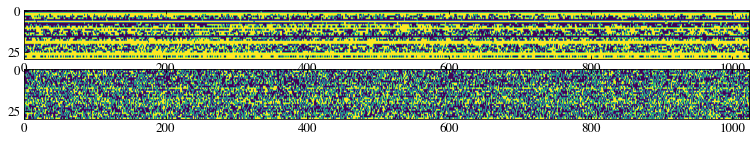

[n = 050] ELBO = -170.418396 (-215.061768)


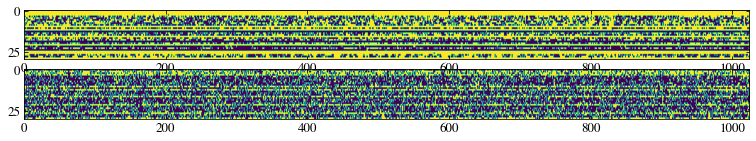

[n = 100] ELBO = -39.265888 (-209.406115)


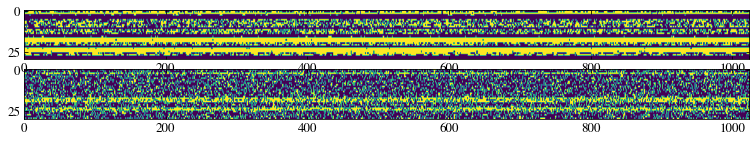

[n = 150] ELBO = -250.376312 (-205.494117)


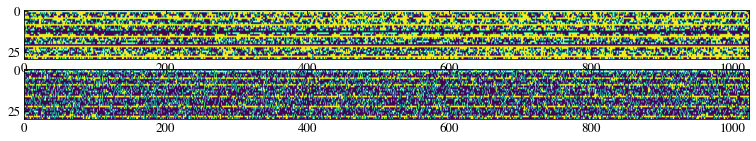

[n = 200] ELBO = -31.735380 (-204.985167)


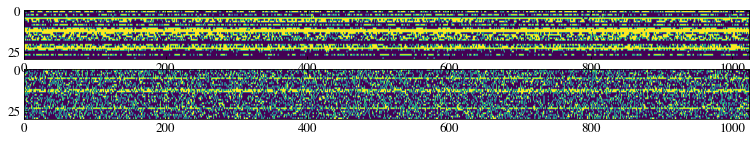

[n = 250] ELBO = -99.448563 (-193.289455)


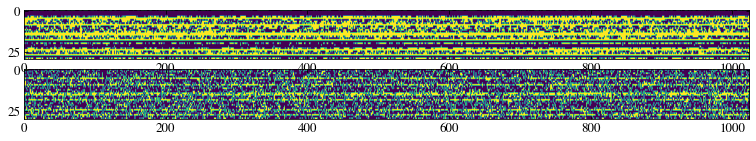

[n = 300] ELBO = -171.136795 (-193.394238)


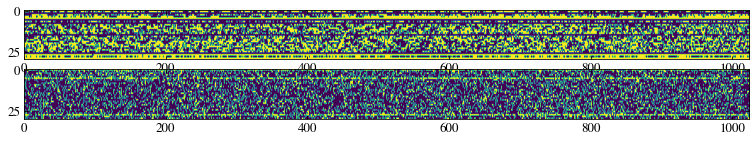

[n = 350] ELBO = -360.779938 (-201.792866)


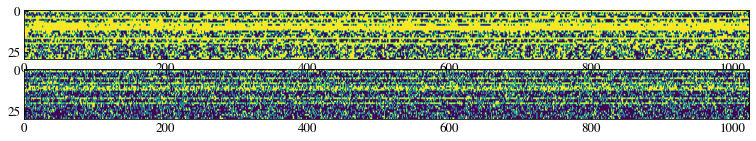

[n = 400] ELBO = -132.830231 (-195.351410)


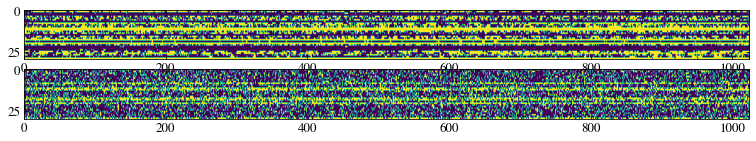

[n = 450] ELBO = -349.872711 (-200.906143)


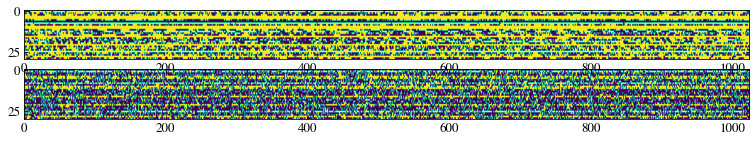

[n = 500] ELBO = -171.017792 (-208.948588)


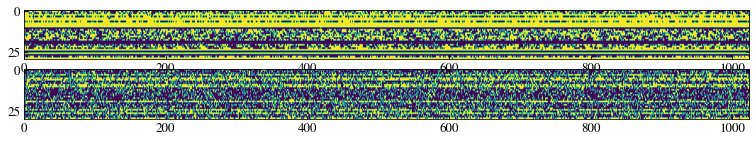

[n = 550] ELBO = -128.495773 (-203.687822)


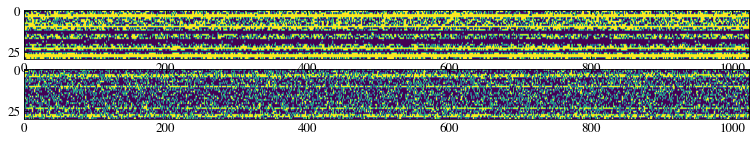

[n = 600] ELBO = -238.238312 (-205.451314)


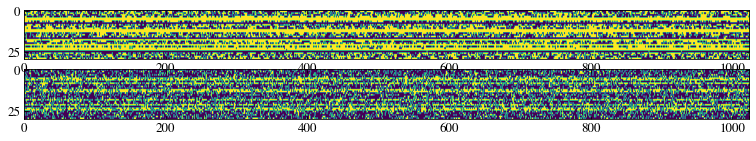

[n = 650] ELBO = -151.322693 (-200.487861)


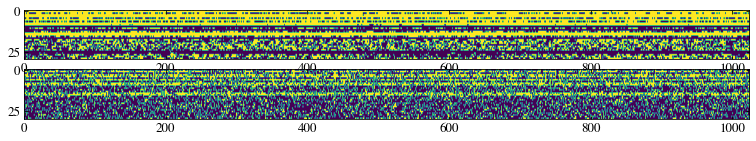

[n = 700] ELBO = -163.828384 (-202.838181)


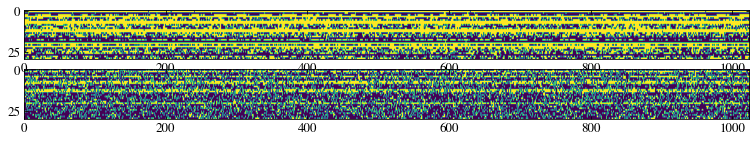

[n = 750] ELBO = -295.687836 (-203.881691)


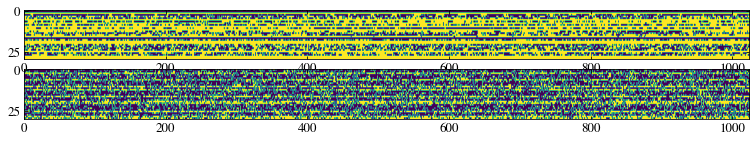

[n = 800] ELBO = -147.398529 (-198.206127)


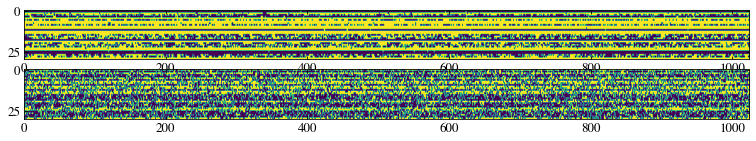

[n = 850] ELBO = -217.213562 (-197.240839)


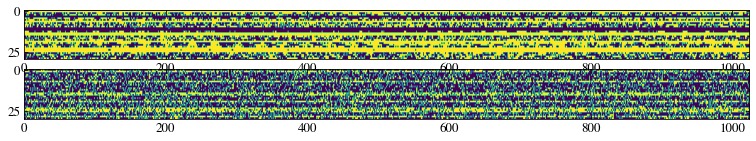

[n = 900] ELBO = -137.333633 (-191.627126)


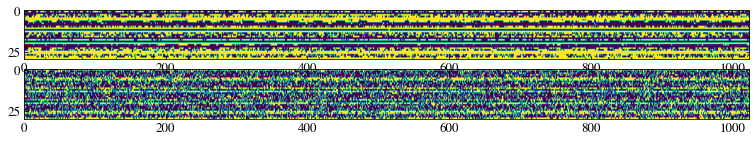

[n = 950] ELBO = -184.470032 (-204.670168)


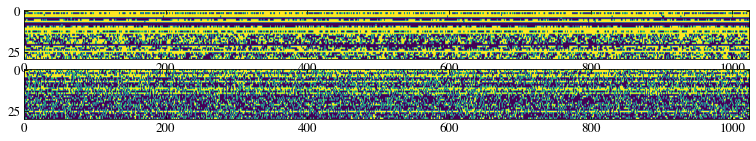

[n = 1000] ELBO = -208.171967 (-199.766754)


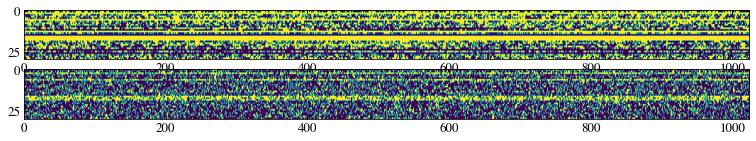

[n = 1050] ELBO = -263.988617 (-203.199030)


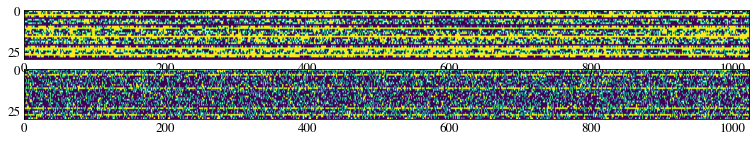

[n = 1100] ELBO = -49.760117 (-199.152945)


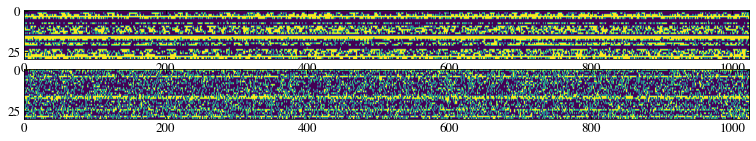

[n = 1150] ELBO = -102.717850 (-197.510846)


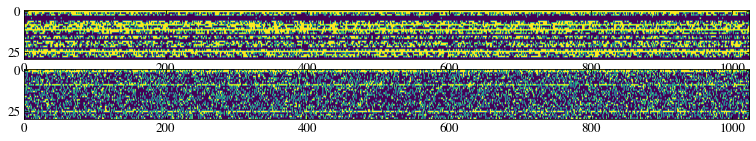

[n = 1200] ELBO = -259.268097 (-200.346851)


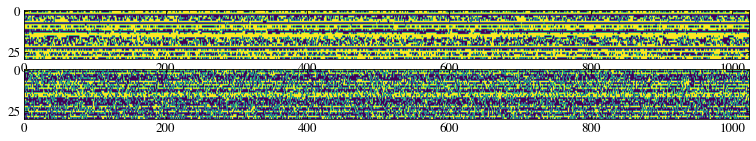

[n = 1250] ELBO = -183.485901 (-193.115232)


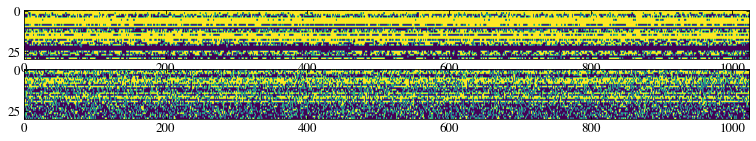

[n = 1300] ELBO = -133.116592 (-188.854390)


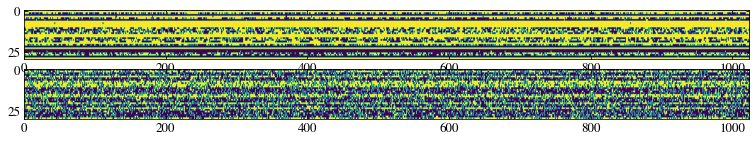

[n = 1350] ELBO = -255.029785 (-205.445730)


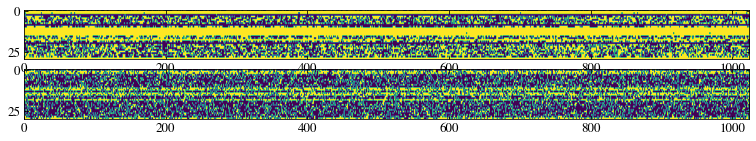

[n = 1400] ELBO = -170.179977 (-197.165320)


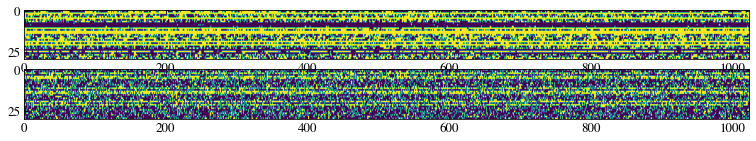

[n = 1450] ELBO = -323.622467 (-201.673819)


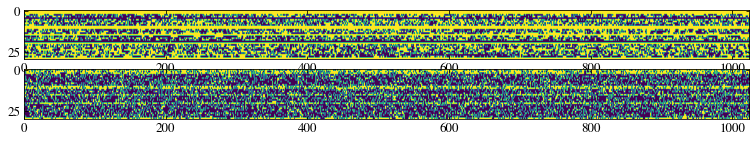

[n = 1500] ELBO = -127.038139 (-200.041623)


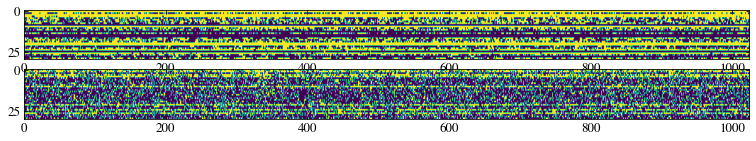

[n = 1550] ELBO = -221.096146 (-194.146618)


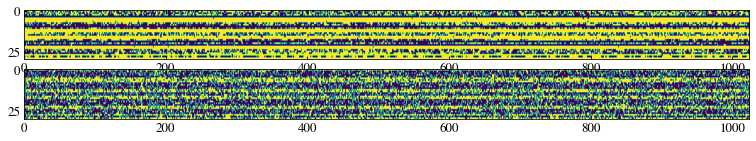

[n = 1600] ELBO = -167.321777 (-201.768688)


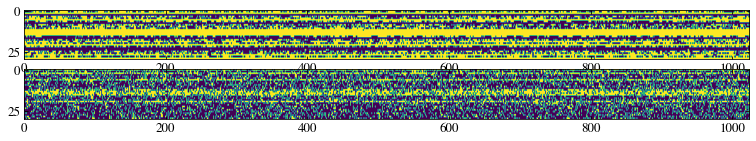

[n = 1650] ELBO = -290.571198 (-204.555292)


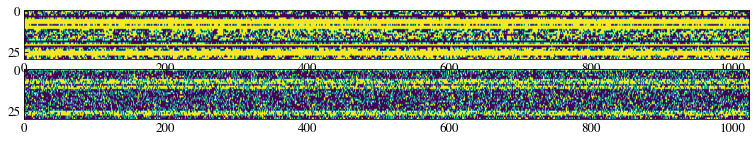

[n = 1700] ELBO = -238.924637 (-200.585893)


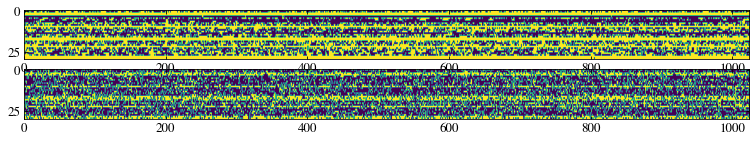

[n = 1750] ELBO = -232.276627 (-204.120048)


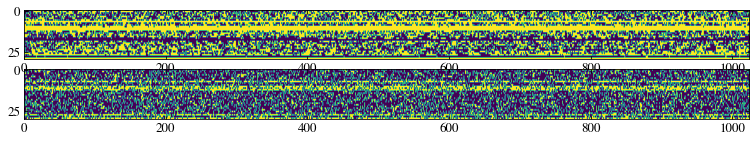

[n = 1800] ELBO = -229.685974 (-201.699551)


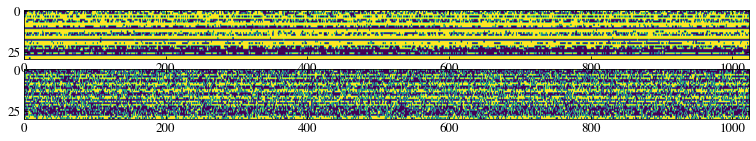

[n = 1850] ELBO = -218.382706 (-196.663595)


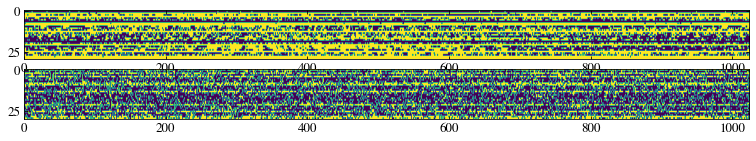

[n = 1900] ELBO = -169.671967 (-207.038023)


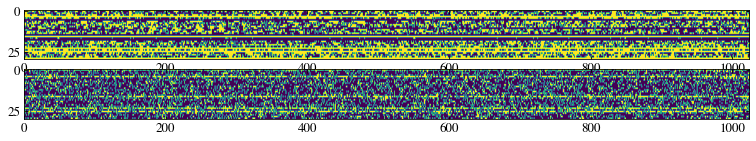

[n = 1950] ELBO = -152.608734 (-200.859370)


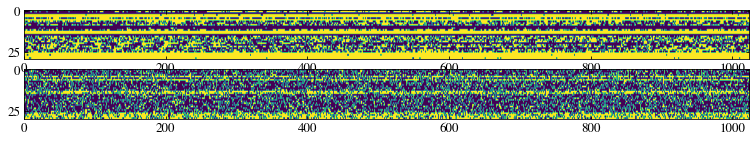

[n = 2000] ELBO = -316.772308 (-208.386639)


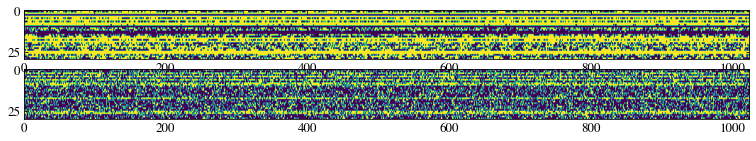

[n = 2050] ELBO = -400.272003 (-203.439633)


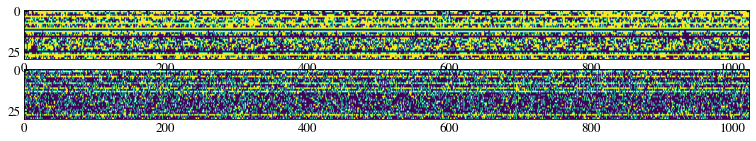

[n = 2100] ELBO = -271.988342 (-198.291004)


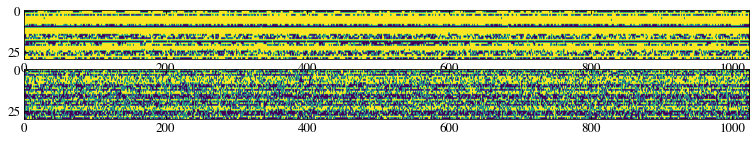

[n = 2150] ELBO = -248.250092 (-203.500244)


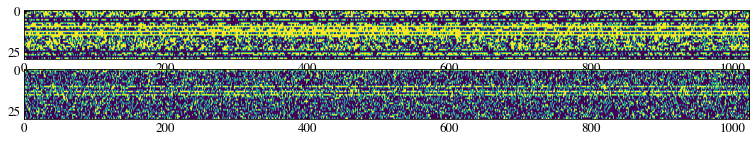

[n = 2200] ELBO = 14.933075 (-199.325456)


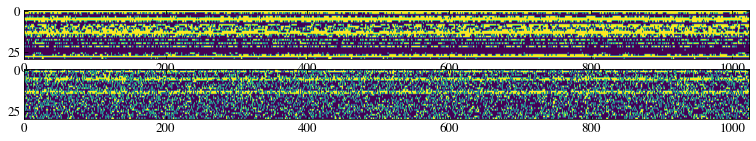

[n = 2250] ELBO = -330.159302 (-201.023512)


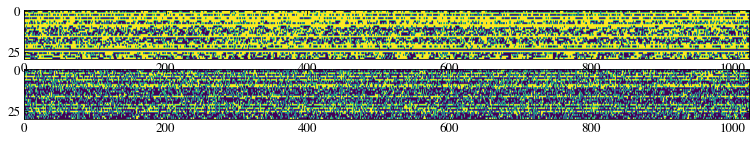

[n = 2300] ELBO = -258.753235 (-195.336193)


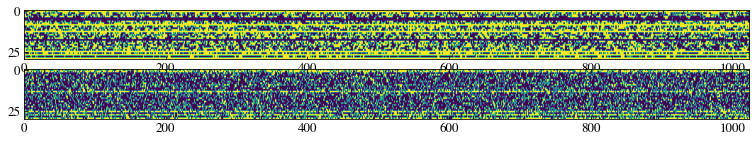

[n = 2350] ELBO = -230.102692 (-196.681390)


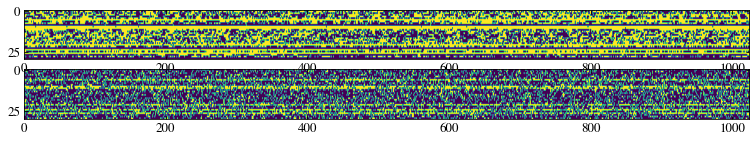

[n = 2400] ELBO = -280.364227 (-202.893729)


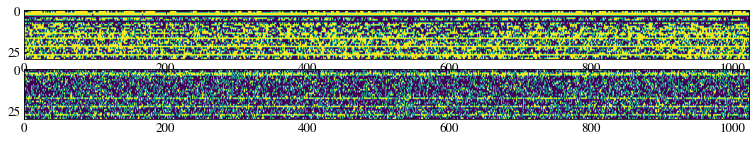

[n = 2450] ELBO = -213.355453 (-202.021223)


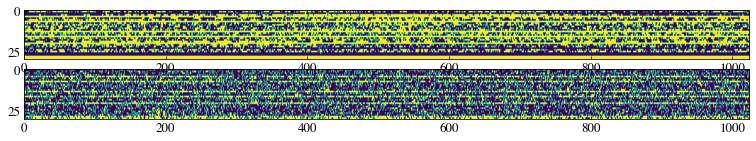

[n = 2500] ELBO = -111.733078 (-202.444174)


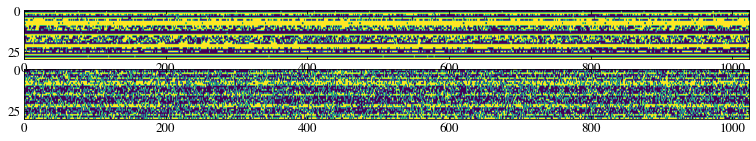

[n = 2550] ELBO = -308.164703 (-214.138411)


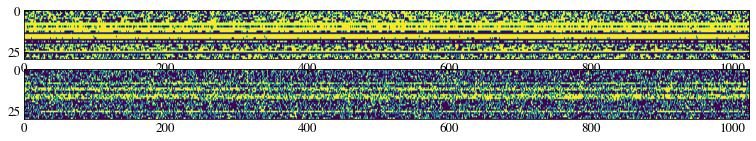

[n = 2600] ELBO = -292.829529 (-195.954885)


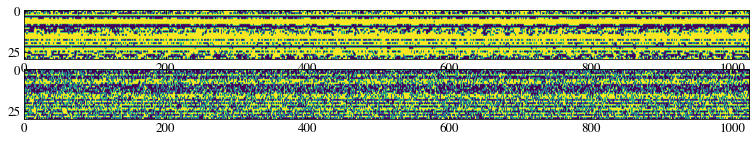

[n = 2650] ELBO = -225.666046 (-204.214145)


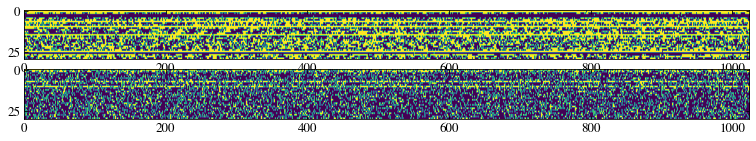

[n = 2700] ELBO = -283.690338 (-202.417512)


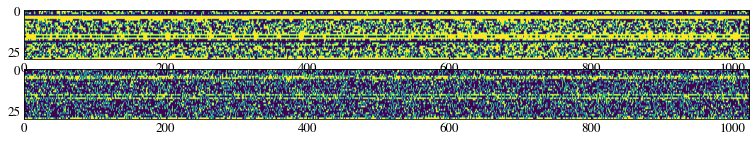

[n = 2750] ELBO = -211.977921 (-198.742173)


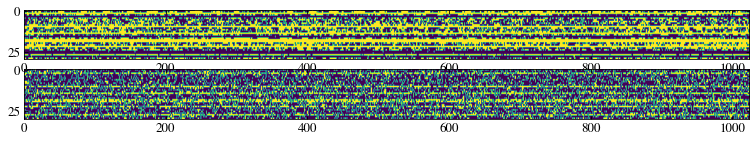

[n = 2800] ELBO = -153.719757 (-205.383405)


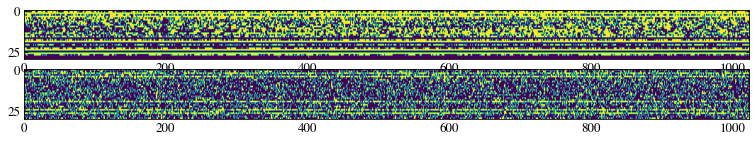

[n = 2850] ELBO = -285.638245 (-203.367555)


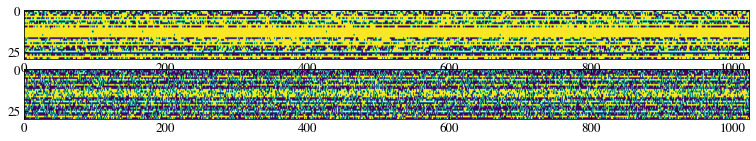

[n = 2900] ELBO = -134.352646 (-197.279317)


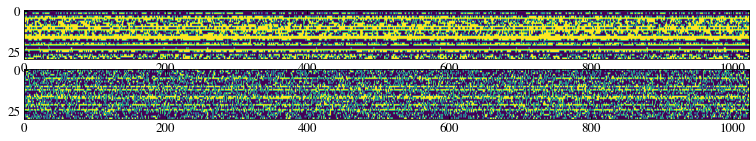

[n = 2950] ELBO = -279.726105 (-202.127228)


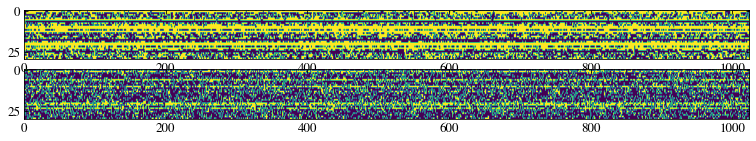

In [41]:
model = TCVAE(z_dim=latent_dim, beta=beta, prior_dist=prior_dist, q_dist=q_dist)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
train_loader=DataLoader(dataset=spin2d, batch_size=30, shuffle=True)

train_elbo = []
dataset_size = len(train_loader.dataset)
num_iter = len(train_loader)*100
elbo_run_mean = utils.RunningAverageMeter()

for n in range(num_iter):
    for i,x in enumerate(train_loader):
        model.train()
        optimizer.zero_grad()
        obj, elbo = model.elbo(x, dataset_size)
        if utils.isnan(obj).any(): break
        obj.mean().mul(-1).backward()
        elbo_run_mean.update(elbo.mean().item())
        optimizer.step()
        
    if n%50==0:
        train_elbo.append(elbo_run_mean.avg)
        print('[n = %03d] ELBO = %.6f (%.6f)'%(n, elbo_run_mean.val, elbo_run_mean.avg))
        display_samples(model, x)

In [24]:
spin2dtest = np.arange(200*30*32*32)
spin2dtest = spin2dtest.reshape(200*30, 32*32)
for n in range (30):
    txt = np.loadtxt(f'isingspin/spin32_{n:02d}.txt')
    spin2dtest[200*n:200*(n+1)] = txt[:, 2:].reshape(200, 32*32)

spin2dtest = torch.Tensor(spin2dtest)

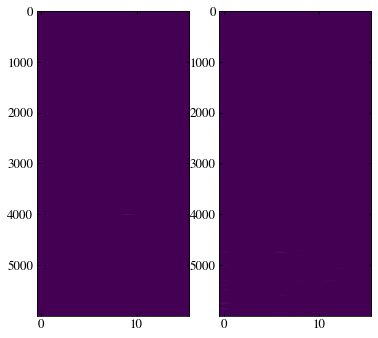

In [33]:
xs, x_params, zs, z_params = model.reconstruct_img(spin2dtest)
test_mu = z_params[:, :, 0].detach().numpy()
test_logsig = z_params[:, :, 1].detach().numpy()
test_var = np.exp(test_logsig * 2)
fig, ax = plt.subplots(1,2, figsize = (6, 6))
ax[0].imshow(test_mu, aspect = 16/3000)
ax[1].imshow(test_var, aspect = 16/3000)

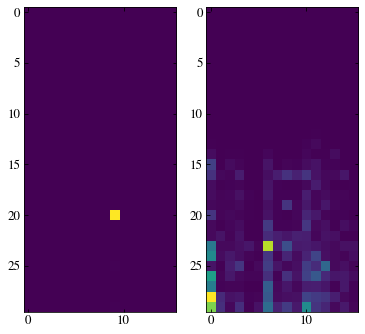

In [34]:
test_ens_mu = np.zeros((30, latent_dim))
test_ens_logsig = np.zeros((30, latent_dim))
for i in range(30):
    test_ens_mu[i] = np.average(z_params[i*200:(i+1)*200, :, 0].detach().numpy(), axis=0)
    test_ens_logsig[i] = np.average(z_params[i*200:(i+1)*200, :, 1].detach().numpy(), axis=0)
test_ens_var = np.exp(test_ens_logsig * 2)
fig, ax = plt.subplots(1,2, figsize = (6, 6))
ax[0].imshow(test_ens_mu, aspect = latent_dim*2/30)
ax[1].imshow(test_ens_var, aspect = latent_dim*2/30)

In [11]:
torch.save(model.state_dict(), 'frozen/VAE2.pth')

# PCA

In [12]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

[3.44851816 0.22856651 0.02311985]


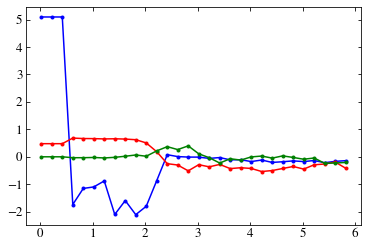

[1.88685383e-02 1.45707588e-04 1.62100645e-05]


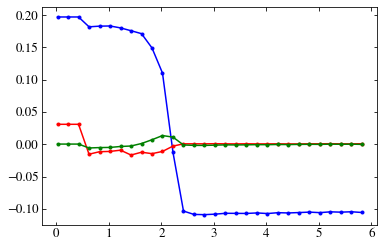

In [13]:
#scaler1 = StandardScaler()
#scaler1.fit(test_mu)
#mu_scaled = scaler1.transform(test_mu)
pca1 = PCA(n_components=3)
pca1.fit(test_ens_mu)
mu_pca = pca1.transform(test_ens_mu)

#scaler2 = StandardScaler()
#scaler2.fit(test_var)
#var_scaled = scaler2.transform(test_var)
pca2 = PCA(n_components=3)
pca2.fit(test_ens_var)
var_pca = pca2.transform(test_ens_var)

T = np.arange(30)*0.2+0.02
TT = np.repeat(T, 1)

plt.plot(TT, mu_pca[:,0], 'b.-')
plt.plot(TT, mu_pca[:,1], 'r.-')
plt.plot(TT, mu_pca[:,2], 'g.-')
print(pca1.explained_variance_)
plt.show()

plt.plot(TT, var_pca[:,0], 'b.-')
plt.plot(TT, var_pca[:,1], 'r.-')
plt.plot(TT, var_pca[:,2], 'g.-')
print(pca2.explained_variance_)
plt.show()

In [60]:
"""### VAE
cCh=16
ksize=7
fD=cCh*2*20*20
zD=16
class VAE(nn.Module):
    def __init__(self, imgCh=1): # 7: 32-26-20, 5: 32-28-24
        super().__init__()
    
        self.eC1 = nn.Conv2d(imgCh, cCh, kernel_size = ksize)
        self.eC2 = nn.Conv2d(cCh, cCh*2, kernel_size = ksize)
        self.eL1 = nn.Linear(fD, zD) 
        self.eL2 = nn.Linear(fD, zD)
    
        self.dL1 = nn.Linear(zD, fD)
        self.dC1 = nn.ConvTranspose2d(cCh*2, cCh, ksize)
        self.dC2 = nn.ConvTranspose2d(cCh, imgCh, ksize)
    
        self.actv = nn.SELU()
        self.Sigm = torch.Sigmoid()
    
    def encoder(self, x):
        x = self.actv(self.eC1(x))
        x = self.actv(self.eC2(x))
        x = x.view(-1, fD)
        mu = self.eL1(x)
        logvar = self.eL2(x)
        return mu, logvar
    
    def reparameterize(self, mu, logvar):
        std = torch.exp(logvar/2)
        eps = torch.randn_like(std)
        return mu + std * eps
    
    def decoder(self, z):
        x = self.actv(self.dL1(z))
        x = x.view(-1, cCh*2, 20, 20)
        x = self.actv(self.dC1(x))
        x = self.Sigm(self.dC2(x))
        return x
    
    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        out = self.decoder(z)
        return out, mu, logvar"""